In [1]:
import numpy as np
import pandas as pd
from glob import glob
from scipy import stats
from scipy.stats import rankdata
from pathlib import Path
import matplotlib.pyplot as plt

import optuna
from optuna.visualization import (
    plot_contour
    , plot_edf
    , plot_intermediate_values
    , plot_optimization_history
    , plot_parallel_coordinate
    , plot_param_importances
    , plot_slice
)

optuna.logging.set_verbosity(optuna.logging.ERROR)

import sys
sys.path.append("../utils")
from metrics import compute_recall_at4, compute_normalized_gini, compute_amex_metric

In [2]:
DATASET_VERSION = "06"
SUB_PATH =  Path(f"../data/subs/blend-dsv{DATASET_VERSION}")

if not SUB_PATH.exists():
    SUB_PATH.mkdir(parents=True, exist_ok=True)

***
## load data

In [3]:
# lgbm-dart

files = sorted(glob(f"../data/oof/lgbm-dart-bce-dsv{DATASET_VERSION}/oof-*.csv"))[:5]
display(files)
dfs = [pd.read_csv(fn) for fn in files]
df1 = dfs[0][["target"]].copy()

for i,_df in enumerate(dfs):
    df1[f"pred{i}"] = _df["pred"].values
    metric = compute_amex_metric(_df["target"].values, _df["pred"].values)
    print(f"fold: {i} - metric: {metric:0.5f}")
    
df1

['../data/oof/lgbm-dart-bce-dsv06/oof-cv0.csv',
 '../data/oof/lgbm-dart-bce-dsv06/oof-cv1.csv',
 '../data/oof/lgbm-dart-bce-dsv06/oof-cv2.csv',
 '../data/oof/lgbm-dart-bce-dsv06/oof-cv3.csv',
 '../data/oof/lgbm-dart-bce-dsv06/oof-cv4.csv']

fold: 0 - metric: 0.79799
fold: 1 - metric: 0.79879
fold: 2 - metric: 0.79844
fold: 3 - metric: 0.79818
fold: 4 - metric: 0.79860


,target,pred0,pred1,pred2,pred3,pred4
0,0,0.000095,0.000128,0.000138,0.000116,0.000117
1,0,0.000804,0.001130,0.000724,0.001103,0.001426
2,0,0.000869,0.000912,0.000853,0.000747,0.000597
3,0,0.004440,0.003948,0.002493,0.003693,0.003480
4,0,0.000796,0.001086,0.001268,0.000582,0.001294
...,...,...,...,...,...,...
458908,0,0.002392,0.003892,0.003660,0.003264,0.002494
458909,0,0.030060,0.025925,0.040111,0.027865,0.028593
458910,0,0.001829,0.001508,0.001151,0.001780,0.000986
458911,1,0.117354,0.088613,0.100317,0.090126,0.109475


In [4]:
# lgbm-dart-xtree

files = sorted(glob(f"../data/oof/lgbm-dart-xtree-bce-dsv{DATASET_VERSION}/oof-*.csv"))[:5]
display(files)
dfs = [pd.read_csv(fn) for fn in files]
df2 = dfs[0][["target"]].copy()

for i,_df in enumerate(dfs):
    df2[f"pred{i}"] = _df["pred"].values
    metric = compute_amex_metric(_df["target"].values, _df["pred"].values)
    print(f"fold: {i} - metric: {metric:0.5f}")
    
df2

['../data/oof/lgbm-dart-xtree-bce-dsv06/oof-cv0.csv',
 '../data/oof/lgbm-dart-xtree-bce-dsv06/oof-cv1.csv',
 '../data/oof/lgbm-dart-xtree-bce-dsv06/oof-cv2.csv',
 '../data/oof/lgbm-dart-xtree-bce-dsv06/oof-cv3.csv',
 '../data/oof/lgbm-dart-xtree-bce-dsv06/oof-cv4.csv']

fold: 0 - metric: 0.79748
fold: 1 - metric: 0.79798
fold: 2 - metric: 0.79786
fold: 3 - metric: 0.79803
fold: 4 - metric: 0.79788


,target,pred0,pred1,pred2,pred3,pred4
0,0,0.000189,0.000166,0.000201,0.000213,0.000258
1,0,0.001057,0.001005,0.001008,0.001135,0.001122
2,0,0.000947,0.000614,0.000748,0.000761,0.000778
3,0,0.003632,0.004046,0.004359,0.003645,0.003286
4,0,0.001679,0.001893,0.001689,0.001466,0.001526
...,...,...,...,...,...,...
458908,0,0.003449,0.003692,0.004880,0.003706,0.004327
458909,0,0.033513,0.031128,0.033232,0.032937,0.031267
458910,0,0.002019,0.002351,0.001553,0.001812,0.001505
458911,1,0.114709,0.091910,0.105601,0.100970,0.109620


In [5]:
# lgbm-dart-linear

#files = sorted(glob("../data/oof/lgbm-dart-linear-bce-dsv02/oof-*.csv"))[:3]
#display(files)
#dfs = [pd.read_csv(fn) for fn in files]
#df3 = dfs[0][["target"]].copy()

#for i,_df in enumerate(dfs):
#    df3[f"pred{i}"] = _df["pred"].values
    
#df3

In [6]:
# xgboost

files = sorted(glob(f"../data/oof/xgboost-dsv{DATASET_VERSION}/oof-*.csv"))[:5]
display(files)
dfs = [pd.read_csv(fn) for fn in files]
df4 = dfs[0][["target"]].copy()

for i,_df in enumerate(dfs):
    df4[f"pred{i}"] = _df["pred"].values
    metric = compute_amex_metric(_df["target"].values, _df["pred"].values)
    print(f"fold: {i} - metric: {metric:0.5f}")
df4

['../data/oof/xgboost-dsv06/oof-cv0.csv',
 '../data/oof/xgboost-dsv06/oof-cv1.csv',
 '../data/oof/xgboost-dsv06/oof-cv2.csv',
 '../data/oof/xgboost-dsv06/oof-cv3.csv',
 '../data/oof/xgboost-dsv06/oof-cv4.csv']

fold: 0 - metric: 0.79648
fold: 1 - metric: 0.79632
fold: 2 - metric: 0.79594
fold: 3 - metric: 0.79597
fold: 4 - metric: 0.79611


,target,pred0,pred1,pred2,pred3,pred4
0,0,0.000096,0.000073,0.000164,0.000094,0.000070
1,0,0.000788,0.000974,0.001366,0.000932,0.001188
2,0,0.000740,0.000771,0.000631,0.000705,0.000669
3,0,0.002451,0.003942,0.002688,0.002539,0.002340
4,0,0.000892,0.001002,0.001330,0.000850,0.001032
...,...,...,...,...,...,...
458908,0,0.003096,0.004354,0.003162,0.002905,0.004234
458909,0,0.032671,0.034379,0.046839,0.022963,0.023139
458910,0,0.001596,0.001919,0.001635,0.002483,0.001434
458911,1,0.119456,0.081441,0.100497,0.100461,0.098918


In [7]:
# catboost

files = sorted(glob(f"../data/oof/catboost-dsv{DATASET_VERSION}/oof-*.csv"))[:5]
display(files)
dfs = [pd.read_csv(fn) for fn in files]
df5 = dfs[0][["target"]].copy()

for i,_df in enumerate(dfs):
    df5[f"pred{i}"] = _df["pred"].values
    metric = compute_amex_metric(_df["target"].values, _df["pred"].values)
    print(f"fold: {i} - metric: {metric:0.5f}")
df5

['../data/oof/catboost-dsv06/oof-cv0.csv',
 '../data/oof/catboost-dsv06/oof-cv1.csv',
 '../data/oof/catboost-dsv06/oof-cv2.csv',
 '../data/oof/catboost-dsv06/oof-cv3.csv',
 '../data/oof/catboost-dsv06/oof-cv4.csv']

fold: 0 - metric: 0.79605
fold: 1 - metric: 0.79645
fold: 2 - metric: 0.79595
fold: 3 - metric: 0.79625
fold: 4 - metric: 0.79644


,target,pred0,pred1,pred2,pred3,pred4
0,0,0.000191,0.000197,0.000267,0.000189,0.000223
1,0,0.001183,0.001485,0.001466,0.000970,0.001358
2,0,0.001208,0.001135,0.001153,0.001085,0.001225
3,0,0.002713,0.003295,0.002812,0.003551,0.002272
4,0,0.003396,0.003921,0.002803,0.003093,0.003718
...,...,...,...,...,...,...
458908,0,0.004157,0.004186,0.004414,0.003585,0.005130
458909,0,0.025236,0.027420,0.029509,0.016522,0.021056
458910,0,0.001418,0.001590,0.001375,0.001132,0.001681
458911,1,0.092656,0.077181,0.101103,0.100114,0.097696


In [8]:
all_dfs = [df1, df2, df4, df5]

***
## correlation

In [9]:
df1.drop("target", axis=1).corr(method="spearman")

,pred0,pred1,pred2,pred3,pred4
pred0,1.000000,0.996207,0.996118,0.996131,0.996173
pred1,0.996207,1.000000,0.996206,0.996227,0.996251
pred2,0.996118,0.996206,1.000000,0.996146,0.996175
pred3,0.996131,0.996227,0.996146,1.000000,0.996183
pred4,0.996173,0.996251,0.996175,0.996183,1.000000


In [10]:
df2.drop("target", axis=1).corr(method="spearman")

,pred0,pred1,pred2,pred3,pred4
pred0,1.000000,0.997731,0.997768,0.997736,0.997724
pred1,0.997731,1.000000,0.997786,0.997756,0.997751
pred2,0.997768,0.997786,1.000000,0.997782,0.997793
pred3,0.997736,0.997756,0.997782,1.000000,0.997762
pred4,0.997724,0.997751,0.997793,0.997762,1.000000


In [11]:
#df3.drop("target", axis=1).corr(method="spearman")

In [12]:
df4.drop("target", axis=1).corr(method="spearman")

,pred0,pred1,pred2,pred3,pred4
pred0,1.000000,0.994731,0.994731,0.994704,0.994688
pred1,0.994731,1.000000,0.994712,0.994719,0.994709
pred2,0.994731,0.994712,1.000000,0.994697,0.994687
pred3,0.994704,0.994719,0.994697,1.000000,0.994668
pred4,0.994688,0.994709,0.994687,0.994668,1.000000


In [13]:
df5.drop("target", axis=1).corr(method="spearman")

,pred0,pred1,pred2,pred3,pred4
pred0,1.000000,0.995992,0.996021,0.995993,0.995934
pred1,0.995992,1.000000,0.996075,0.996040,0.996007
pred2,0.996021,0.996075,1.000000,0.996047,0.996022
pred3,0.995993,0.996040,0.996047,1.000000,0.996047
pred4,0.995934,0.996007,0.996022,0.996047,1.000000


In [14]:
# corr on cv0
n = len(all_dfs)
corr_array = np.zeros((n,n))
# on cv0
for i,_df1 in enumerate(all_dfs):
    for j,_df2 in enumerate(all_dfs):
        corr = stats.spearmanr(_df1.pred0.values, _df2.pred0.values)[0]
        corr_array[i,j] = corr
        
corr_array

array([[1.        , 0.99642897, 0.99493718, 0.99219966],
       [0.99642897, 1.        , 0.99421315, 0.99379723],
       [0.99493718, 0.99421315, 1.        , 0.98966883],
       [0.99219966, 0.99379723, 0.98966883, 1.        ]])

In [15]:
# corr on cv1
n = len(all_dfs)
corr_array = np.zeros((n,n))
# on cv0
for i,_df1 in enumerate(all_dfs):
    for j,_df2 in enumerate(all_dfs):
        corr = stats.spearmanr(_df1.pred1.values, _df2.pred1.values)[0]
        corr_array[i,j] = corr
        
corr_array

array([[1.        , 0.99648955, 0.99502347, 0.99231261],
       [0.99648955, 1.        , 0.99429746, 0.99378973],
       [0.99502347, 0.99429746, 1.        , 0.9898031 ],
       [0.99231261, 0.99378973, 0.9898031 , 1.        ]])

In [16]:
# corr on cv2
n = len(all_dfs)
corr_array = np.zeros((n,n))
# on cv0
for i,_df1 in enumerate(all_dfs):
    for j,_df2 in enumerate(all_dfs):
        corr = stats.spearmanr(_df1.pred2.values, _df2.pred2.values)[0]
        corr_array[i,j] = corr
corr_array

array([[1.        , 0.99639361, 0.99490464, 0.99219714],
       [0.99639361, 1.        , 0.99416924, 0.99379123],
       [0.99490464, 0.99416924, 1.        , 0.98945708],
       [0.99219714, 0.99379123, 0.98945708, 1.        ]])

***
## optimal blend

In [17]:
def compute_optimal_blend(all_dfs, on_cv=0, rank=False):
    
    target = all_dfs[0].target.values
    preds = [df[f"pred{on_cv}"].values.reshape(-1,1) for df in all_dfs]
    preds = np.concatenate(preds, axis=1)
    if rank:
        preds = rankdata(preds, axis=0)
        preds = preds / preds.max(axis=0)
    
    def objective(trial):

        weights = [
            trial.suggest_float(f"w_{i}", 0., 1.) 
            for i in range(len(all_dfs))
        ]
        weights = np.asarray(weights)
        weights /= np.sum(weights)

        blend_pred = (weights*preds).sum(axis=1)

        metric = compute_amex_metric(target, blend_pred)
        return metric

    study = optuna.create_study(
        study_name="blender",
        direction='maximize',
    )

    study.optimize(
        objective, 
        n_trials=2000, 
        timeout=1800, # 1/2 hour
        n_jobs=1, 
        gc_after_trial=True,
    )
    
    return study

***

In [18]:
%%time
study0 = compute_optimal_blend(all_dfs, on_cv=0, rank=False)

CPU times: user 8min 20s, sys: 63.3 ms, total: 8min 20s
Wall time: 8min 20s


In [19]:
print(compute_amex_metric(df1.target.values, df1.pred0.values))
print(compute_amex_metric(df2.target.values, df2.pred0.values))
print(compute_amex_metric(df4.target.values, df4.pred0.values))
print(compute_amex_metric(df5.target.values, df5.pred0.values))

0.7979900517695324
0.7974787882423362
0.7964789457691113
0.7960534009001247


In [20]:
# max: 0.799575
study0.trials_dataframe().sort_values("value", ascending=False).head(10)

,number,value,datetime_start,datetime_complete,duration,params_w_0,params_w_1,params_w_2,params_w_3,state
1413,1413,0.799209,2022-08-24 21:22:59.099214,2022-08-24 21:22:59.220525,0 days 00:00:00.121311,0.912284,0.363433,0.103457,0.647728,COMPLETE
442,442,0.799203,2022-08-24 21:18:57.476863,2022-08-24 21:18:57.576763,0 days 00:00:00.099900,0.928876,0.331102,0.115910,0.632391,COMPLETE
461,461,0.799201,2022-08-24 21:19:01.918908,2022-08-24 21:19:02.018814,0 days 00:00:00.099906,0.962957,0.346035,0.119636,0.680761,COMPLETE
1768,1768,0.799199,2022-08-24 21:24:32.374132,2022-08-24 21:24:32.500843,0 days 00:00:00.126711,0.928100,0.325477,0.117622,0.632989,COMPLETE
272,272,0.799197,2022-08-24 21:18:17.633380,2022-08-24 21:18:17.729307,0 days 00:00:00.095927,0.957754,0.361227,0.104177,0.661049,COMPLETE
1276,1276,0.799196,2022-08-24 21:22:23.580527,2022-08-24 21:22:23.696736,0 days 00:00:00.116209,0.871003,0.315544,0.097387,0.603148,COMPLETE
1269,1269,0.799195,2022-08-24 21:22:21.774761,2022-08-24 21:22:21.893286,0 days 00:00:00.118525,0.913199,0.335365,0.098464,0.642216,COMPLETE
252,252,0.799193,2022-08-24 21:18:12.939295,2022-08-24 21:18:13.035792,0 days 00:00:00.096497,0.901964,0.355030,0.107641,0.636800,COMPLETE
1572,1572,0.799192,2022-08-24 21:23:40.640963,2022-08-24 21:23:40.765548,0 days 00:00:00.124585,0.936791,0.359301,0.095869,0.642633,COMPLETE
1407,1407,0.799191,2022-08-24 21:22:57.535249,2022-08-24 21:22:57.657471,0 days 00:00:00.122222,0.876837,0.351341,0.088559,0.616044,COMPLETE


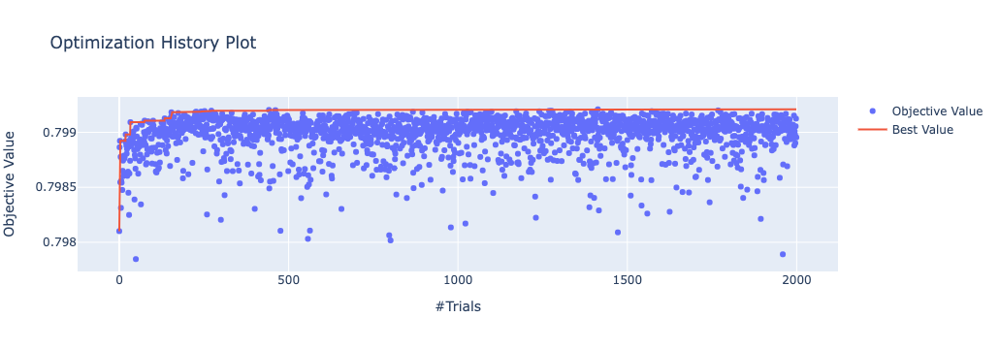

In [21]:
plot_optimization_history(study0)

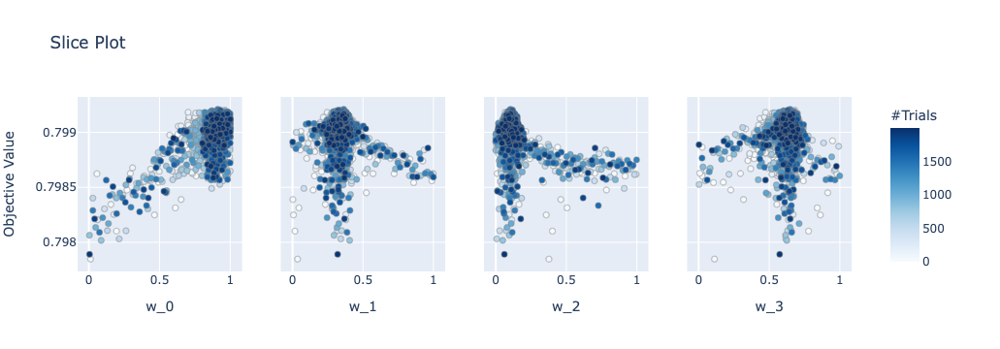

In [22]:
plot_slice(study0)

In [23]:
weights0 = np.asarray([w for w in study0.best_params.values()])
weights0 /=  weights0.sum()
weights0

array([0.45008785, 0.17930474, 0.05104189, 0.31956553])

***

In [24]:
%%time
study1 = compute_optimal_blend(all_dfs, on_cv=1, rank=False)

CPU times: user 8min 35s, sys: 81.9 ms, total: 8min 35s
Wall time: 8min 35s


In [25]:
print(compute_amex_metric(df1.target.values, df1.pred1.values))
print(compute_amex_metric(df2.target.values, df2.pred1.values))
print(compute_amex_metric(df4.target.values, df4.pred1.values))
print(compute_amex_metric(df5.target.values, df5.pred1.values))

0.798785434213442
0.7979806446647484
0.7963173810213919
0.7964464910512234


In [26]:
# max: 0.800090
study1.trials_dataframe().sort_values("value", ascending=False).head(10)

,number,value,datetime_start,datetime_complete,duration,params_w_0,params_w_1,params_w_2,params_w_3,state
323,323,0.799709,2022-08-24 21:26:52.545588,2022-08-24 21:26:52.641812,0 days 00:00:00.096224,0.544750,0.845457,0.738749,0.966861,COMPLETE
853,853,0.799707,2022-08-24 21:29:04.063949,2022-08-24 21:29:04.169850,0 days 00:00:00.105901,0.547453,0.825469,0.748279,0.983196,COMPLETE
1982,1982,0.799705,2022-08-24 21:34:06.640827,2022-08-24 21:34:06.772469,0 days 00:00:00.131642,0.544518,0.798910,0.741021,0.940875,COMPLETE
946,946,0.799704,2022-08-24 21:29:27.788767,2022-08-24 21:29:27.900427,0 days 00:00:00.111660,0.535553,0.810702,0.731289,0.950082,COMPLETE
801,801,0.799703,2022-08-24 21:28:50.955154,2022-08-24 21:28:51.061358,0 days 00:00:00.106204,0.551845,0.832486,0.746395,0.987163,COMPLETE
228,228,0.799703,2022-08-24 21:26:29.789619,2022-08-24 21:26:29.883950,0 days 00:00:00.094331,0.540528,0.806211,0.724603,0.966737,COMPLETE
882,882,0.799702,2022-08-24 21:29:11.418521,2022-08-24 21:29:11.525665,0 days 00:00:00.107144,0.538931,0.770103,0.722711,0.914780,COMPLETE
777,777,0.799702,2022-08-24 21:28:44.842627,2022-08-24 21:28:44.947941,0 days 00:00:00.105314,0.557631,0.810042,0.745714,0.953735,COMPLETE
194,194,0.799702,2022-08-24 21:26:21.739912,2022-08-24 21:26:21.834135,0 days 00:00:00.094223,0.559150,0.814905,0.761043,0.957858,COMPLETE
1910,1910,0.799701,2022-08-24 21:33:46.373529,2022-08-24 21:33:46.502656,0 days 00:00:00.129127,0.549384,0.784423,0.736304,0.936568,COMPLETE


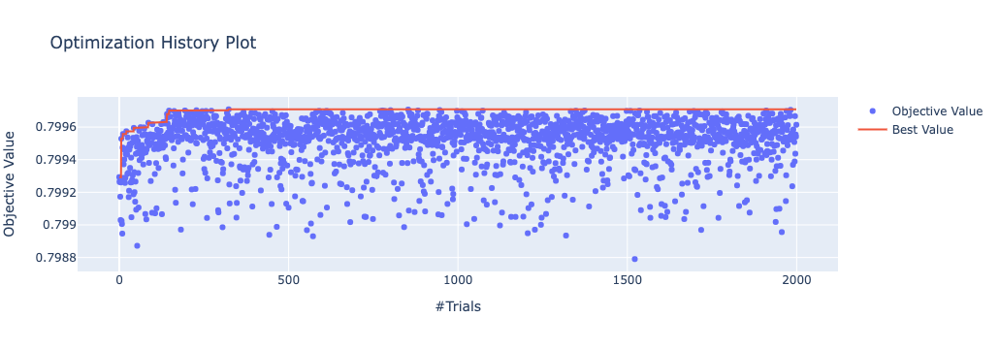

In [27]:
plot_optimization_history(study1)

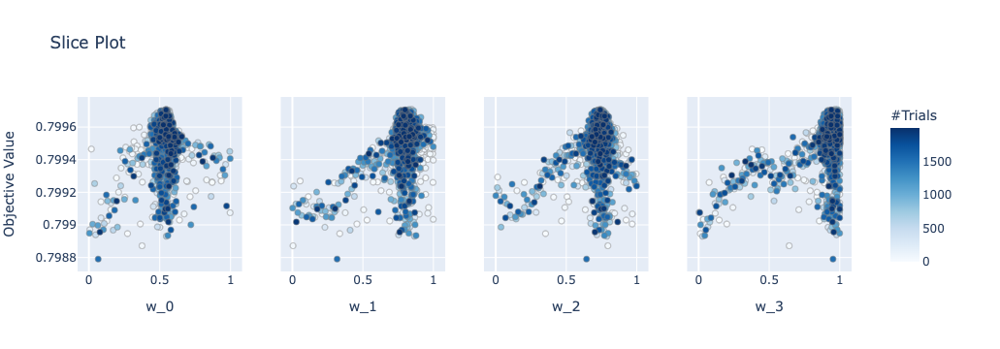

In [28]:
plot_slice(study1)

In [29]:
weights1 = np.asarray([w for w in study1.best_params.values()])
weights1 /=  weights1.sum()
weights1

array([0.17596332, 0.2730965 , 0.23862806, 0.31231212])

***

In [30]:
%%time
study2 = compute_optimal_blend(all_dfs, on_cv=2, rank=False)

CPU times: user 8min 50s, sys: 101 ms, total: 8min 50s
Wall time: 8min 50s


In [31]:
print(compute_amex_metric(df1.target.values, df1.pred2.values))
print(compute_amex_metric(df2.target.values, df2.pred2.values))
print(compute_amex_metric(df4.target.values, df4.pred2.values))
print(compute_amex_metric(df5.target.values, df5.pred2.values))

0.7984374861878563
0.7978588128583453
0.7959397102885597
0.7959457112132742


In [32]:
# max: 0.799861
study2.trials_dataframe().sort_values("value", ascending=False).head(10)

,number,value,datetime_start,datetime_complete,duration,params_w_0,params_w_1,params_w_2,params_w_3,state
1448,1448,0.799559,2022-08-24 21:40:26.825662,2022-08-24 21:40:26.946844,0 days 00:00:00.121182,0.839047,0.742124,0.700316,0.317902,COMPLETE
1805,1805,0.799548,2022-08-24 21:42:06.331252,2022-08-24 21:42:06.456711,0 days 00:00:00.125459,0.914976,0.740912,0.706365,0.322742,COMPLETE
1349,1349,0.799543,2022-08-24 21:39:59.710132,2022-08-24 21:39:59.827217,0 days 00:00:00.117085,0.805663,0.670199,0.661912,0.294739,COMPLETE
1494,1494,0.799543,2022-08-24 21:40:39.490965,2022-08-24 21:40:39.610905,0 days 00:00:00.119940,0.795854,0.674944,0.653158,0.287774,COMPLETE
1390,1390,0.799543,2022-08-24 21:40:10.932043,2022-08-24 21:40:11.052478,0 days 00:00:00.120435,0.799802,0.679919,0.667312,0.299200,COMPLETE
1427,1427,0.799539,2022-08-24 21:40:21.054649,2022-08-24 21:40:21.173492,0 days 00:00:00.118843,0.871569,0.719950,0.699773,0.314547,COMPLETE
1889,1889,0.799539,2022-08-24 21:42:30.496414,2022-08-24 21:42:30.629460,0 days 00:00:00.133046,0.816596,0.688937,0.676655,0.305418,COMPLETE
1489,1489,0.799538,2022-08-24 21:40:38.103154,2022-08-24 21:40:38.223577,0 days 00:00:00.120423,0.807182,0.682364,0.668300,0.288505,COMPLETE
1355,1355,0.799538,2022-08-24 21:40:01.357913,2022-08-24 21:40:01.475061,0 days 00:00:00.117148,0.779731,0.692363,0.655843,0.284202,COMPLETE
1508,1508,0.799536,2022-08-24 21:40:43.376101,2022-08-24 21:40:43.496177,0 days 00:00:00.120076,0.856385,0.699670,0.627625,0.281705,COMPLETE


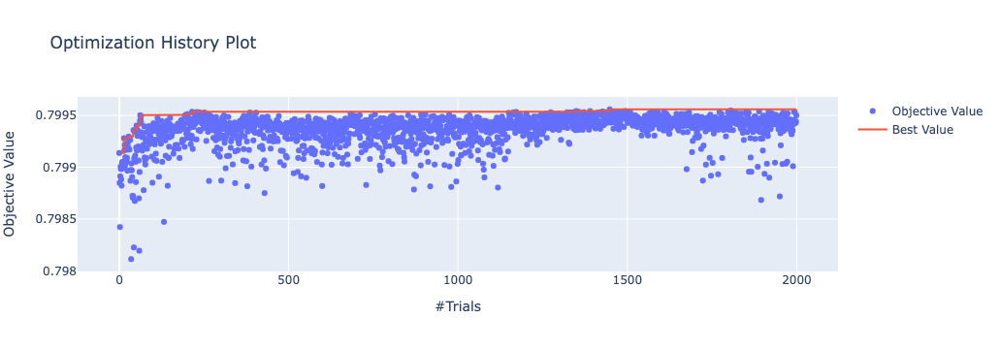

In [33]:
plot_optimization_history(study2)

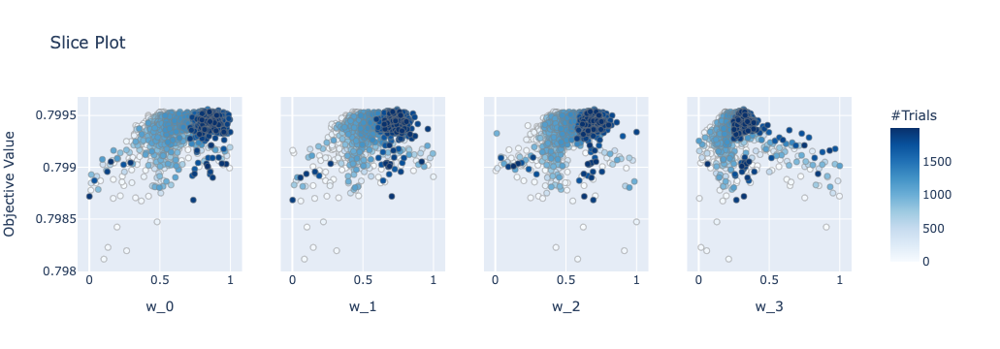

In [34]:
plot_slice(study2)

In [35]:
weights2 = np.asarray([w for w in study2.best_params.values()])
weights2 /=  weights2.sum()
weights2

array([0.32278618, 0.28549919, 0.26941575, 0.12229888])

***

In [36]:
%%time
study3 = compute_optimal_blend(all_dfs, on_cv=3, rank=False)

CPU times: user 9min 4s, sys: 119 ms, total: 9min 4s
Wall time: 9min 4s


In [37]:
print(compute_amex_metric(df1.target.values, df1.pred3.values))
print(compute_amex_metric(df2.target.values, df2.pred3.values))
print(compute_amex_metric(df4.target.values, df4.pred3.values))
print(compute_amex_metric(df5.target.values, df5.pred3.values))

0.7981814587399784
0.7980278789937103
0.7959669320556175
0.7962519322937893


In [38]:
# max: 
study3.trials_dataframe().sort_values("value", ascending=False).head(10)

,number,value,datetime_start,datetime_complete,duration,params_w_0,params_w_1,params_w_2,params_w_3,state
491,491,0.799062,2022-08-24 21:45:08.528239,2022-08-24 21:45:08.627728,0 days 00:00:00.099489,0.927904,0.751657,0.392750,0.185938,COMPLETE
1674,1674,0.799057,2022-08-24 21:50:32.996320,2022-08-24 21:50:33.119615,0 days 00:00:00.123295,0.874820,0.709452,0.364063,0.174286,COMPLETE
1170,1170,0.799053,2022-08-24 21:48:10.831958,2022-08-24 21:48:10.945048,0 days 00:00:00.113090,0.929791,0.762450,0.393932,0.192929,COMPLETE
1599,1599,0.799053,2022-08-24 21:50:11.456508,2022-08-24 21:50:11.579508,0 days 00:00:00.123000,0.852335,0.692639,0.353890,0.175056,COMPLETE
581,581,0.799053,2022-08-24 21:45:32.023003,2022-08-24 21:45:32.124766,0 days 00:00:00.101763,0.974108,0.780058,0.402398,0.193677,COMPLETE
1739,1739,0.799053,2022-08-24 21:50:51.792370,2022-08-24 21:50:51.917381,0 days 00:00:00.125011,0.879592,0.722741,0.366608,0.173610,COMPLETE
1489,1489,0.799052,2022-08-24 21:49:40.047677,2022-08-24 21:49:40.167371,0 days 00:00:00.119694,0.881103,0.710218,0.350309,0.172071,COMPLETE
1591,1591,0.799052,2022-08-24 21:50:09.173663,2022-08-24 21:50:09.295530,0 days 00:00:00.121867,0.913003,0.720802,0.355202,0.175913,COMPLETE
121,121,0.799052,2022-08-24 21:43:34.103524,2022-08-24 21:43:34.196222,0 days 00:00:00.092698,0.872847,0.704348,0.348916,0.166266,COMPLETE
1609,1609,0.799049,2022-08-24 21:50:14.311367,2022-08-24 21:50:14.432785,0 days 00:00:00.121418,0.845605,0.687507,0.360664,0.180336,COMPLETE


In [39]:
plot_optimization_history(study3)

In [40]:
plot_slice(study3)

In [41]:
weights3 = np.asarray([w for w in study3.best_params.values()])
weights3 /=  weights3.sum()
weights3

array([0.41089548, 0.33284947, 0.17391799, 0.08233706])

***

In [42]:
%%time
study4 = compute_optimal_blend(all_dfs, on_cv=4, rank=False)

CPU times: user 9min 19s, sys: 105 ms, total: 9min 19s
Wall time: 9min 19s


In [43]:
print(compute_amex_metric(df1.target.values, df1.pred4.values))
print(compute_amex_metric(df2.target.values, df2.pred4.values))
print(compute_amex_metric(df4.target.values, df4.pred4.values))
print(compute_amex_metric(df5.target.values, df5.pred4.values))

0.7985967661697848
0.7978798904517468
0.7961092070084148
0.7964435782548722


In [44]:
# max: 
study4.trials_dataframe().sort_values("value", ascending=False).head(10)

,number,value,datetime_start,datetime_complete,duration,params_w_0,params_w_1,params_w_2,params_w_3,state
1720,1720,0.799552,2022-08-24 22:00:05.292534,2022-08-24 22:00:05.416156,0 days 00:00:00.123622,0.941521,0.321632,0.179807,0.432518,COMPLETE
1879,1879,0.799547,2022-08-24 22:00:52.957013,2022-08-24 22:00:53.087861,0 days 00:00:00.130848,0.930669,0.313672,0.171498,0.429792,COMPLETE
1229,1229,0.799545,2022-08-24 21:57:42.011197,2022-08-24 21:57:42.125036,0 days 00:00:00.113839,0.936619,0.389035,0.109239,0.368164,COMPLETE
1383,1383,0.799540,2022-08-24 21:58:26.469673,2022-08-24 21:58:26.586968,0 days 00:00:00.117295,0.885845,0.293939,0.171847,0.409294,COMPLETE
1710,1710,0.799539,2022-08-24 22:00:02.312746,2022-08-24 22:00:02.436867,0 days 00:00:00.124121,0.943615,0.310784,0.179390,0.435514,COMPLETE
1727,1727,0.799539,2022-08-24 22:00:07.367274,2022-08-24 22:00:07.493921,0 days 00:00:00.126647,0.960353,0.311228,0.177122,0.435146,COMPLETE
1671,1671,0.799536,2022-08-24 21:59:50.766282,2022-08-24 21:59:50.890489,0 days 00:00:00.124207,0.958561,0.337396,0.186074,0.441788,COMPLETE
908,908,0.799534,2022-08-24 21:56:11.835543,2022-08-24 21:56:11.944678,0 days 00:00:00.109135,0.888910,0.360997,0.109189,0.355307,COMPLETE
1647,1647,0.799532,2022-08-24 21:59:43.701056,2022-08-24 21:59:43.823653,0 days 00:00:00.122597,0.962355,0.343345,0.185412,0.444196,COMPLETE
1711,1711,0.799527,2022-08-24 22:00:02.608647,2022-08-24 22:00:02.734992,0 days 00:00:00.126345,0.940058,0.320089,0.183387,0.435547,COMPLETE


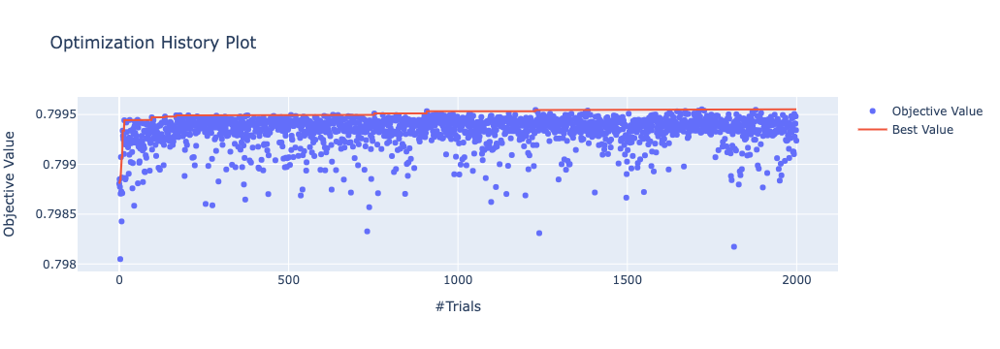

In [45]:
plot_optimization_history(study4)

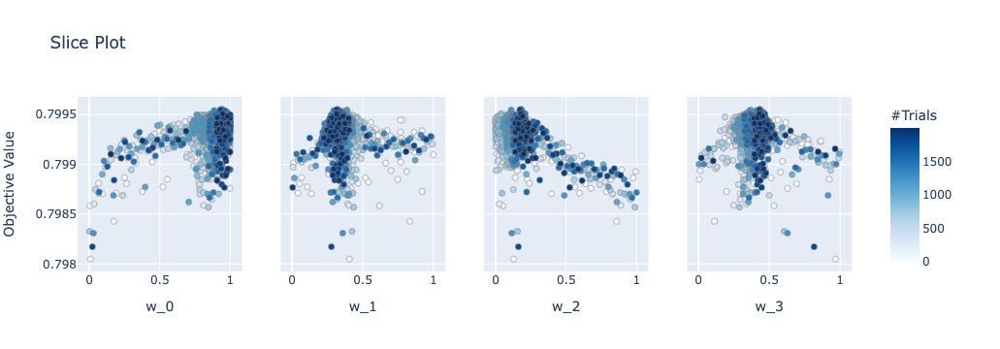

In [46]:
plot_slice(study4)

In [47]:
weights4 = np.asarray([w for w in study4.best_params.values()])
weights4 /=  weights4.sum()
weights4

array([0.50201664, 0.17149331, 0.09587245, 0.2306176 ])

***
## blend

In [48]:
all_weights = [weights0, weights1, weights2, weights3, weights4]
np.mean(all_weights, axis=0)

array([0.37234989, 0.24844864, 0.16577523, 0.21342624])

In [49]:
sub1 = pd.read_csv(f"../data/subs/lgbm-dart-bce-dsv{DATASET_VERSION}/submission-all.csv")
sub2 = pd.read_csv(f"../data/subs/lgbm-dart-xtree-bce-dsv{DATASET_VERSION}/submission-all.csv")
#sub3 = pd.read_csv(f"../data/subs/lgbm-dart-linear-bce-dsv{DATASET_VERSION}/submission-all.csv")
sub4 = pd.read_csv(f"../data/subs/xgboost-dsv{DATASET_VERSION}/submission-all.csv")
sub5 = pd.read_csv(f"../data/subs/catboost-dsv{DATASET_VERSION}/submission-all.csv")

In [50]:
preds = np.concatenate([
    sub1.prediction.values.reshape(-1,1),
    sub2.prediction.values.reshape(-1,1),
    #sub3.prediction.values.reshape(-1,1),
    sub4.prediction.values.reshape(-1,1),
    sub5.prediction.values.reshape(-1,1)
    ],
    axis=1
)
#preds = rankdata(preds, axis=0)
#preds = preds / preds.max(axis=0)

In [51]:
sub = sub1.copy()

blend0 = (preds*weights0).sum(axis=1)
blend1 = (preds*weights1).sum(axis=1)
blend2 = (preds*weights2).sum(axis=1)
blend3 = (preds*weights3).sum(axis=1)
blend4 = (preds*weights4).sum(axis=1)

sub["prediction"] = np.mean([blend0, blend1, blend2, blend3, blend4], axis=0)

In [52]:
sub.to_csv(SUB_PATH/"submission-blend.csv", index=False)

In [53]:
sub.prediction.describe()

count    924621.000000
mean          0.247222
std           0.346027
min           0.000031
25%           0.002639
50%           0.025491
75%           0.473244
max           0.999916
Name: prediction, dtype: float64

***